In [1]:
import matplotlib.pyplot as plt
import numpy as np
import tensorflow as tf
import cv2
import os
import kagglehub
path = kagglehub.dataset_download("ultralytics/brain-tumor")

print("Path to dataset files:", path)
os.listdir(path)

100%|██████████| 4.19M/4.19M [00:00<00:00, 75.7MB/s]

Extracting files...


Path to dataset files: /root/.cache/kagglehub/datasets/ultralytics/brain-tumor/versions/2


['brain-tumor', 'brain-tumor.yaml']

In [16]:
data_path =  path + "/brain-tumor"
os.listdir(data_path)
yaml = os.path.join(path,"brain-tumor.yaml")

In [3]:
train_images_path = data_path + "/train/images"
train_labels_path = data_path + "/train/labels"
val_images_path = data_path + "/valid/images"
val_labels_path = data_path + "/valid/labels"

In [4]:
class_names=['negative','positive']

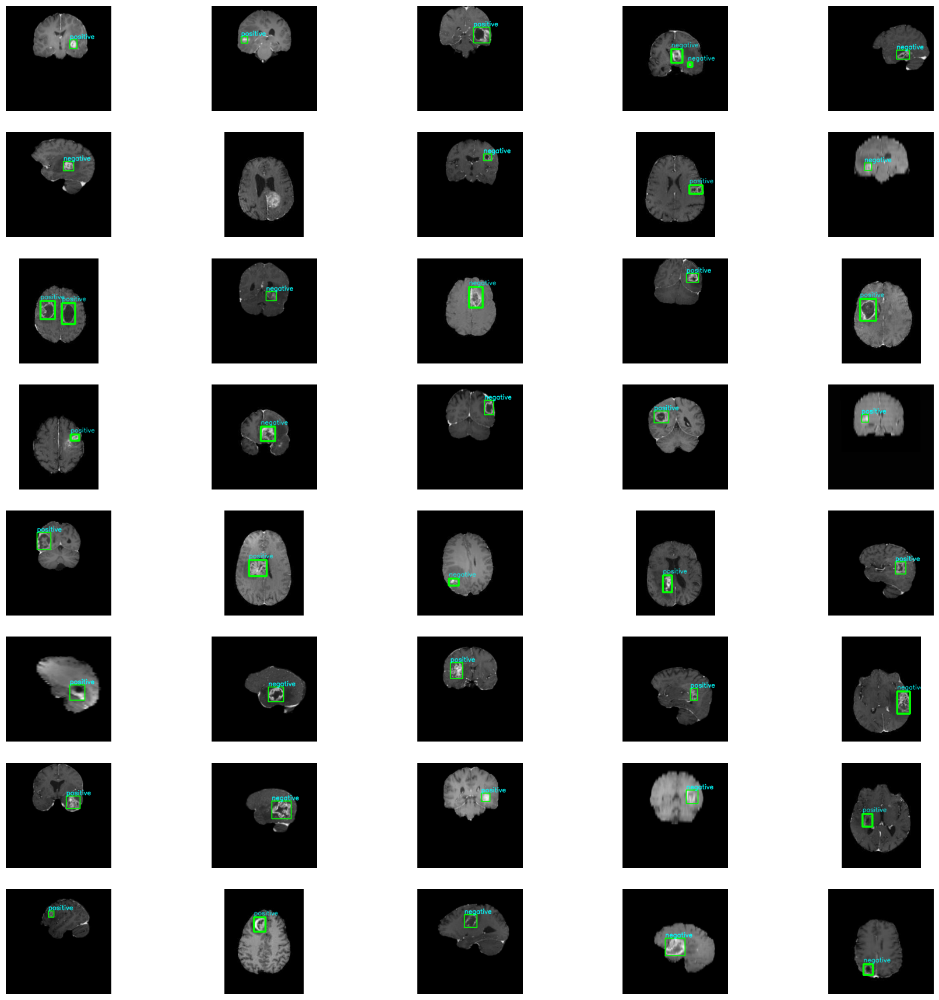

In [39]:
import random
image_files = os.listdir(train_images_path)
random_images = random.sample(image_files, 40)

fig, axs = plt.subplots(8, 5, figsize=(22, 22))
axs = axs.flatten()

for i, image_file in enumerate(random_images):
    image_path = os.path.join(train_images_path, image_file)
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    label_file = os.path.splitext(image_file)[0] + ".txt"
    label_path = os.path.join(train_labels_path, label_file)

    if os.path.exists(label_path):
        with open(label_path, "r") as f:
            labels = f.read().strip().split("\n")

        for label in labels:
            if len(label.split()) != 5:
                continue
            class_id, x_center, y_center, width, height = map(float, label.split())
            x_min = int((x_center - width / 2) * image.shape[1])
            y_min = int((y_center - height / 2) * image.shape[0])
            x_max = int((x_center + width / 2) * image.shape[1])
            y_max = int((y_center + height / 2) * image.shape[0])

            cv2.rectangle(image, (x_min, y_min), (x_max, y_max), (0, 255, 0), 3)

            text_scale = max(0.5, min(image.shape[1], image.shape[0]) / 500)
            text_thickness = max(1, int(text_scale * 2))
            classe = class_names[int(class_id)]
            cv2.putText(
                image,
                classe,
                (x_min, max(y_min - 5, 0)),
                cv2.FONT_HERSHEY_SIMPLEX,
                text_scale,
                (0, 255, 255),
                text_thickness,
                cv2.LINE_AA,
            )

    axs[i].imshow(image)
    axs[i].axis('off')

plt.subplots_adjust(wspace=0.2, hspace=0.2)
plt.show()

In [6]:
try:
  from ultralytics import YOLO
except:
  !pip install ultralytics
  from ultralytics import YOLO

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 914.8/914.8 kB 29.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 98.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 84.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 53.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 838.4 kB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 13.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 85.3 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninsta

In [7]:
tumor_model = YOLO("yolov8n.pt")

100%|██████████| 6.25M/6.25M [00:00<00:00, 135MB/s]


In [18]:
tumor_model.train(data=yaml,epochs=20,imgsz=480,batch=16)

Ultralytics 8.3.72 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=/root/.cache/kagglehub/datasets/ultralytics/brain-tumor/versions/2/brain-tumor.yaml, epochs=20, time=None, patience=100, batch=16, imgsz=480, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save

100%|██████████| 4.23M/4.23M [00:00<00:00, 83.4MB/s]
Unzipping /content/datasets/brain-tumor.zip to /content/datasets/brain-tumor...: 100%|██████████| 2225/2225 [00:00<00:00, 7316.71file/s]

Dataset download success ✅ (0.9s), saved to /content/datasets



100%|██████████| 755k/755k [00:00<00:00, 18.9MB/s]


Overriding model.yaml nc=80 with nc=2

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  7                  -1  1    295424  ultralytics

100%|██████████| 5.35M/5.35M [00:00<00:00, 99.8MB/s]


AMP: checks passed ✅


train: Scanning /content/datasets/brain-tumor/train/labels... 878 images, 15 backgrounds, 0 corrupt: 100%|██████████| 893/893 [00:00<00:00, 2218.06it/s]

train: New cache created: /content/datasets/brain-tumor/train/labels.cache


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


/usr/local/lib/python3.11/dist-packages/albumentations/__init__.py:24: UserWarning: A new version of Albumentations is available: 2.0.3 (you have 1.4.20). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()
val: Scanning /content/datasets/brain-tumor/valid/labels... 223 images, 0 backgrounds, 0 corrupt: 100%|██████████| 223/223 [00:00<00:00, 1194.45it/s]


val: New cache created: /content/datasets/brain-tumor/valid/labels.cache
Plotting labels to runs/detect/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001667, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 480 train, 480 val
Using 2 dataloader workers
Logging results to runs/detect/train
Starting training for 20 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/20      1.22G      1.403      3.023      1.183         20        480: 100%|██████████| 56/56 [00:15<00:00,  3.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.53it/s]

                   all        223        241    0.00347      0.921      0.157      0.118



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/20      1.18G      1.225          2      1.071         28        480: 100%|██████████| 56/56 [00:13<00:00,  4.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.67it/s]

                   all        223        241      0.435      0.707      0.464      0.294



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/20      1.19G      1.239      1.816      1.108         26        480: 100%|██████████| 56/56 [00:13<00:00,  4.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.90it/s]


                   all        223        241      0.468      0.749      0.467      0.305

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/20      1.19G      1.192      1.667      1.081         17        480: 100%|██████████| 56/56 [00:11<00:00,  4.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.94it/s]

                   all        223        241      0.432      0.789      0.452      0.306



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/20      1.19G      1.179      1.548      1.069         19        480: 100%|██████████| 56/56 [00:09<00:00,  5.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  3.30it/s]

                   all        223        241      0.456      0.797      0.477      0.318



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/20      1.19G      1.129       1.45      1.049         18        480: 100%|██████████| 56/56 [00:11<00:00,  4.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  5.20it/s]

                   all        223        241      0.446      0.826      0.463      0.315



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/20      1.19G      1.158      1.369      1.067         27        480: 100%|██████████| 56/56 [00:12<00:00,  4.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  5.42it/s]

                   all        223        241       0.44      0.826      0.487      0.326



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/20      1.19G      1.098      1.308      1.039         14        480: 100%|██████████| 56/56 [00:12<00:00,  4.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  5.33it/s]

                   all        223        241      0.445      0.837       0.48      0.343



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/20      1.19G      1.103      1.255      1.036         16        480: 100%|██████████| 56/56 [00:12<00:00,  4.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.97it/s]

                   all        223        241      0.429      0.836      0.463      0.315



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/20      1.19G      1.072      1.232      1.023         25        480: 100%|██████████| 56/56 [00:10<00:00,  5.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  3.20it/s]

                   all        223        241      0.429      0.794      0.504      0.338


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/20      1.19G     0.9877      1.188     0.9966         14        480: 100%|██████████| 56/56 [00:11<00:00,  5.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  3.86it/s]

                   all        223        241      0.435      0.837      0.439      0.295



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/20      1.19G      0.979      1.128     0.9867         15        480: 100%|██████████| 56/56 [00:11<00:00,  4.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  5.19it/s]

                   all        223        241      0.443      0.851      0.451      0.304



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/20      1.19G      0.962      1.111     0.9822         15        480: 100%|██████████| 56/56 [00:12<00:00,  4.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  5.21it/s]


                   all        223        241      0.454      0.854      0.481      0.345

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/20      1.19G     0.9215      1.061     0.9671         14        480: 100%|██████████| 56/56 [00:12<00:00,  4.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  5.24it/s]

                   all        223        241      0.421      0.879      0.452       0.32



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/20      1.19G     0.8951      1.034     0.9506         13        480: 100%|██████████| 56/56 [00:10<00:00,  5.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.95it/s]

                   all        223        241      0.426      0.866      0.444      0.319



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/20      1.19G     0.8945     0.9952     0.9513         13        480: 100%|██████████| 56/56 [00:10<00:00,  5.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  5.36it/s]

                   all        223        241      0.431      0.897      0.457      0.334



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/20      1.19G     0.8722     0.9569     0.9432         11        480: 100%|██████████| 56/56 [00:12<00:00,  4.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  5.12it/s]


                   all        223        241      0.424      0.924      0.437      0.314

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/20      1.19G     0.8637     0.9309     0.9445         14        480: 100%|██████████| 56/56 [00:12<00:00,  4.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  5.20it/s]

                   all        223        241      0.419      0.913      0.437      0.309



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/20      1.19G     0.8227     0.8917     0.9229         16        480: 100%|██████████| 56/56 [00:11<00:00,  4.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  3.28it/s]

                   all        223        241      0.414      0.868      0.467      0.332



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/20      1.19G     0.8275     0.8549     0.9228         16        480: 100%|██████████| 56/56 [00:09<00:00,  5.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  3.38it/s]

                   all        223        241      0.411      0.898      0.449      0.324



20 epochs completed in 0.081 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 6.2MB
Optimizer stripped from runs/detect/train/weights/best.pt, 6.2MB

Validating runs/detect/train/weights/best.pt...
Ultralytics 8.3.72 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 168 layers, 3,006,038 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.65it/s]


                   all        223        241      0.453      0.853       0.48      0.345
              negative        142        154      0.562      0.891      0.582       0.42
              positive         81         87      0.344      0.816      0.378       0.27
Speed: 0.2ms preprocess, 2.1ms inference, 0.0ms loss, 4.2ms postprocess per image
Results saved to runs/detect/train


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7bc889e921d0>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0.04804


image 1/1 /root/.cache/kagglehub/datasets/ultralytics/brain-tumor/versions/2/brain-tumor/valid/images/val_1 (144).jpg: 480x480 1 negative, 10.1ms
Speed: 2.4ms preprocess, 10.1ms inference, 1.5ms postprocess per image at shape (1, 3, 480, 480)


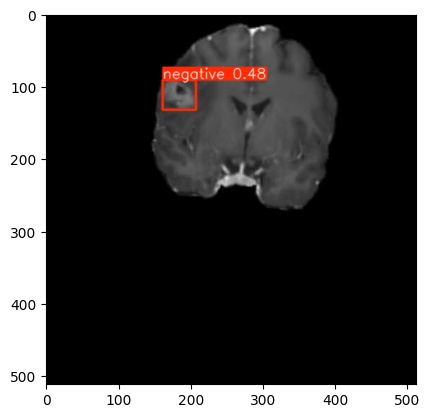

Image: val_1 (144).jpg
Boîte: [161.13851928710938, 91.07820892333984, 207.02719116210938, 132.6199493408203]
Class: 0
Confiance: 0.48
------------------------------

image 1/1 /root/.cache/kagglehub/datasets/ultralytics/brain-tumor/versions/2/brain-tumor/valid/images/val_1 (170).jpg: 480x480 1 negative, 1 positive, 7.3ms
Speed: 3.6ms preprocess, 7.3ms inference, 1.4ms postprocess per image at shape (1, 3, 480, 480)


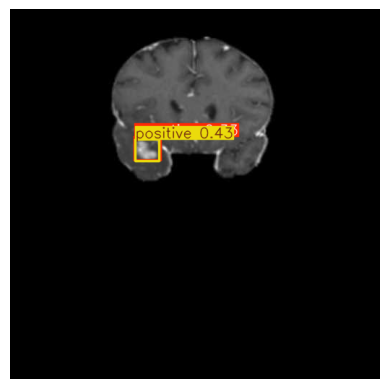

Image: val_1 (170).jpg
Boîte: [173.20880126953125, 180.18312072753906, 206.8834686279297, 210.21505737304688]
Class: 1
Confiance: 0.43
------------------------------
Image: val_1 (170).jpg
Boîte: [172.51809692382812, 176.965576171875, 208.00608825683594, 209.2965545654297]
Class: 0
Confiance: 0.33
------------------------------

image 1/1 /root/.cache/kagglehub/datasets/ultralytics/brain-tumor/versions/2/brain-tumor/valid/images/val_1 (140).jpg: 480x480 1 negative, 1 positive, 15.9ms
Speed: 2.7ms preprocess, 15.9ms inference, 1.9ms postprocess per image at shape (1, 3, 480, 480)


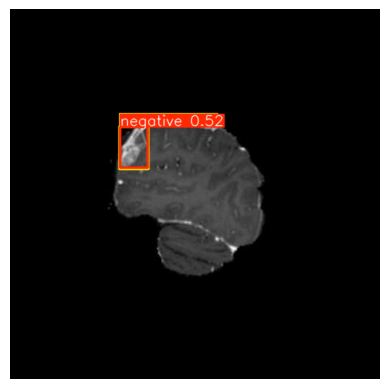

Image: val_1 (140).jpg
Boîte: [152.06658935546875, 163.7637176513672, 190.85354614257812, 219.92257690429688]
Class: 0
Confiance: 0.52
------------------------------
Image: val_1 (140).jpg
Boîte: [151.6320343017578, 162.47549438476562, 191.8844757080078, 221.3906707763672]
Class: 1
Confiance: 0.32
------------------------------

image 1/1 /root/.cache/kagglehub/datasets/ultralytics/brain-tumor/versions/2/brain-tumor/valid/images/val_1 (218).jpg: 480x480 1 positive, 20.6ms
Speed: 4.0ms preprocess, 20.6ms inference, 3.8ms postprocess per image at shape (1, 3, 480, 480)


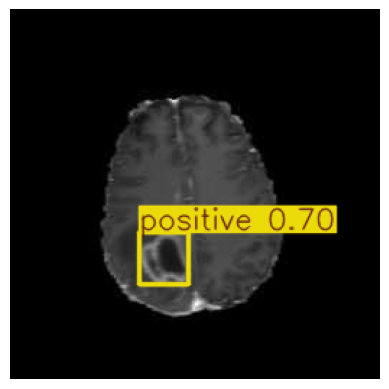

Image: val_1 (218).jpg
Boîte: [89.17868041992188, 154.41586303710938, 123.96963500976562, 190.7113037109375]
Class: 1
Confiance: 0.70
------------------------------

image 1/1 /root/.cache/kagglehub/datasets/ultralytics/brain-tumor/versions/2/brain-tumor/valid/images/val_1 (48).jpg: 480x480 1 negative, 1 positive, 23.2ms
Speed: 2.5ms preprocess, 23.2ms inference, 1.8ms postprocess per image at shape (1, 3, 480, 480)


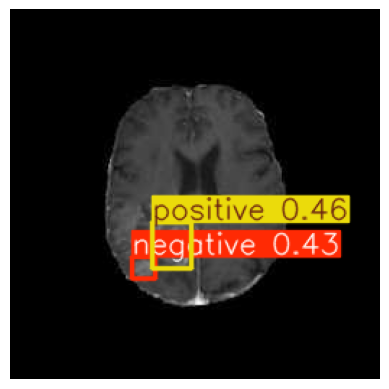

Image: val_1 (48).jpg
Boîte: [98.99571990966797, 147.83079528808594, 125.366455078125, 179.1313934326172]
Class: 1
Confiance: 0.46
------------------------------
Image: val_1 (48).jpg
Boîte: [84.56461334228516, 171.90274047851562, 100.31244659423828, 186.2218780517578]
Class: 0
Confiance: 0.43
------------------------------

image 1/1 /root/.cache/kagglehub/datasets/ultralytics/brain-tumor/versions/2/brain-tumor/valid/images/val_1 (85).jpg: 480x480 1 negative, 12.4ms
Speed: 2.7ms preprocess, 12.4ms inference, 1.9ms postprocess per image at shape (1, 3, 480, 480)


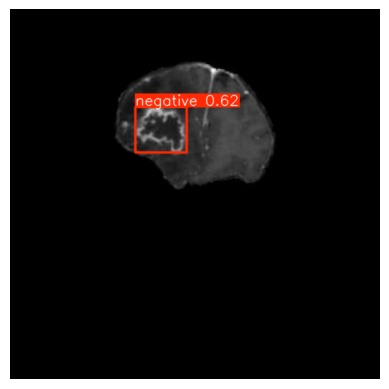

Image: val_1 (85).jpg
Boîte: [173.09902954101562, 135.77662658691406, 244.1928253173828, 198.8287811279297]
Class: 0
Confiance: 0.62
------------------------------

image 1/1 /root/.cache/kagglehub/datasets/ultralytics/brain-tumor/versions/2/brain-tumor/valid/images/val_1 (95).jpg: 480x480 1 negative, 1 positive, 19.4ms
Speed: 2.7ms preprocess, 19.4ms inference, 1.7ms postprocess per image at shape (1, 3, 480, 480)


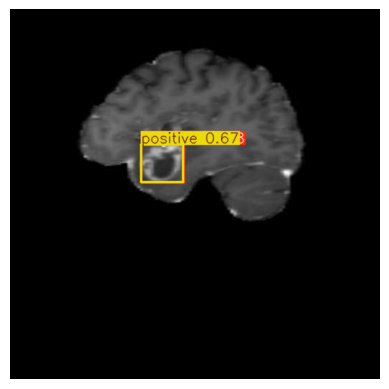

Image: val_1 (95).jpg
Boîte: [181.5432586669922, 187.5191192626953, 239.4630126953125, 239.4408721923828]
Class: 1
Confiance: 0.67
------------------------------
Image: val_1 (95).jpg
Boîte: [181.06813049316406, 187.1016082763672, 240.11968994140625, 240.5602264404297]
Class: 0
Confiance: 0.28
------------------------------

image 1/1 /root/.cache/kagglehub/datasets/ultralytics/brain-tumor/versions/2/brain-tumor/valid/images/val_1 (132).jpg: 480x480 1 negative, 1 positive, 23.6ms
Speed: 2.7ms preprocess, 23.6ms inference, 1.9ms postprocess per image at shape (1, 3, 480, 480)


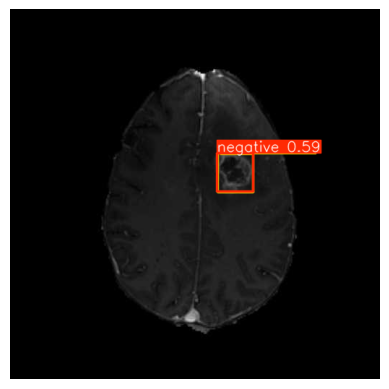

Image: val_1 (132).jpg
Boîte: [286.5842590332031, 199.83966064453125, 336.29168701171875, 252.4014129638672]
Class: 0
Confiance: 0.59
------------------------------
Image: val_1 (132).jpg
Boîte: [287.14349365234375, 200.02793884277344, 336.5675964355469, 253.41485595703125]
Class: 1
Confiance: 0.34
------------------------------

image 1/1 /root/.cache/kagglehub/datasets/ultralytics/brain-tumor/versions/2/brain-tumor/valid/images/val_1 (115).jpg: 480x480 1 negative, 1 positive, 15.1ms
Speed: 2.8ms preprocess, 15.1ms inference, 1.6ms postprocess per image at shape (1, 3, 480, 480)


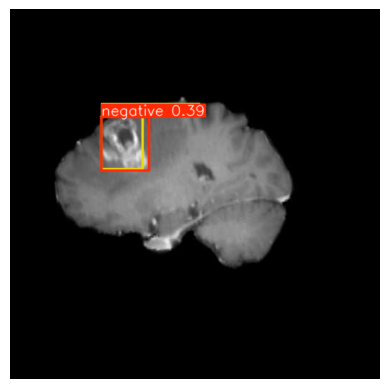

Image: val_1 (115).jpg
Boîte: [126.14909362792969, 149.62631225585938, 192.48341369628906, 223.58848571777344]
Class: 0
Confiance: 0.39
------------------------------
Image: val_1 (115).jpg
Boîte: [126.86782836914062, 148.29737854003906, 183.82672119140625, 221.6312255859375]
Class: 1
Confiance: 0.29
------------------------------

image 1/1 /root/.cache/kagglehub/datasets/ultralytics/brain-tumor/versions/2/brain-tumor/valid/images/val_1 (136).jpg: 480x480 1 negative, 2 positives, 9.5ms
Speed: 2.6ms preprocess, 9.5ms inference, 1.8ms postprocess per image at shape (1, 3, 480, 480)


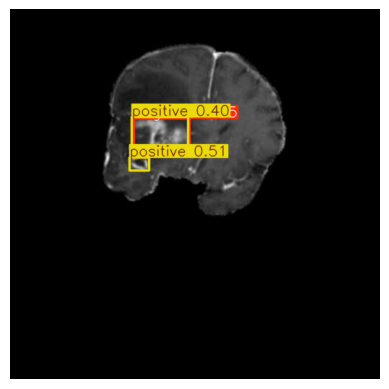

Image: val_1 (136).jpg
Boîte: [165.96383666992188, 205.10440063476562, 192.98623657226562, 223.9417724609375]
Class: 1
Confiance: 0.51
------------------------------
Image: val_1 (136).jpg
Boîte: [168.8822021484375, 149.19265747070312, 246.4643096923828, 196.52957153320312]
Class: 1
Confiance: 0.40
------------------------------
Image: val_1 (136).jpg
Boîte: [171.1173095703125, 151.74932861328125, 248.0730743408203, 196.40428161621094]
Class: 0
Confiance: 0.25
------------------------------

image 1/1 /root/.cache/kagglehub/datasets/ultralytics/brain-tumor/versions/2/brain-tumor/valid/images/val_1 (96).jpg: 480x480 1 negative, 1 positive, 8.8ms
Speed: 2.7ms preprocess, 8.8ms inference, 1.6ms postprocess per image at shape (1, 3, 480, 480)


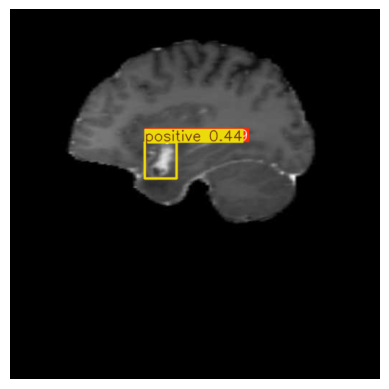

Image: val_1 (96).jpg
Boîte: [186.0498809814453, 184.6209716796875, 230.92872619628906, 234.63888549804688]
Class: 1
Confiance: 0.44
------------------------------
Image: val_1 (96).jpg
Boîte: [186.9878387451172, 183.93849182128906, 230.45645141601562, 234.93692016601562]
Class: 0
Confiance: 0.39
------------------------------

image 1/1 /root/.cache/kagglehub/datasets/ultralytics/brain-tumor/versions/2/brain-tumor/valid/images/val_1 (202).jpg: 480x480 1 negative, 17.3ms
Speed: 2.3ms preprocess, 17.3ms inference, 3.1ms postprocess per image at shape (1, 3, 480, 480)


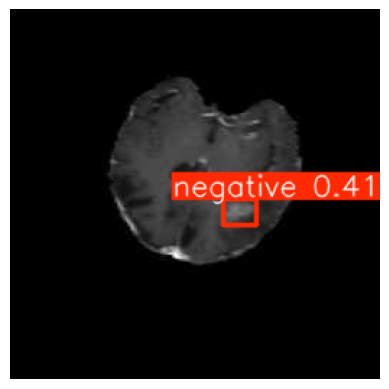

Image: val_1 (202).jpg
Boîte: [147.15980529785156, 131.999267578125, 170.5368194580078, 149.26779174804688]
Class: 0
Confiance: 0.41
------------------------------

image 1/1 /root/.cache/kagglehub/datasets/ultralytics/brain-tumor/versions/2/brain-tumor/valid/images/val_1 (209).jpg: 480x480 1 negative, 1 positive, 17.1ms
Speed: 2.4ms preprocess, 17.1ms inference, 1.6ms postprocess per image at shape (1, 3, 480, 480)


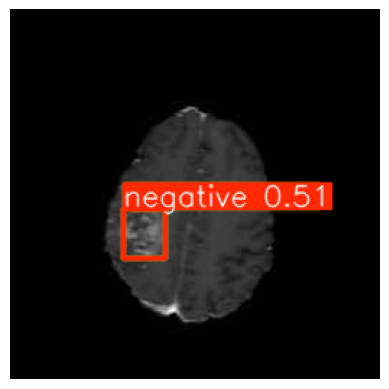

Image: val_1 (209).jpg
Boîte: [78.25933074951172, 138.92539978027344, 107.6273193359375, 172.77142333984375]
Class: 0
Confiance: 0.51
------------------------------
Image: val_1 (209).jpg
Boîte: [78.86231994628906, 138.90353393554688, 107.53102111816406, 172.7416534423828]
Class: 1
Confiance: 0.37
------------------------------

image 1/1 /root/.cache/kagglehub/datasets/ultralytics/brain-tumor/versions/2/brain-tumor/valid/images/val_1 (219).jpg: 480x480 1 positive, 16.7ms
Speed: 2.4ms preprocess, 16.7ms inference, 1.8ms postprocess per image at shape (1, 3, 480, 480)


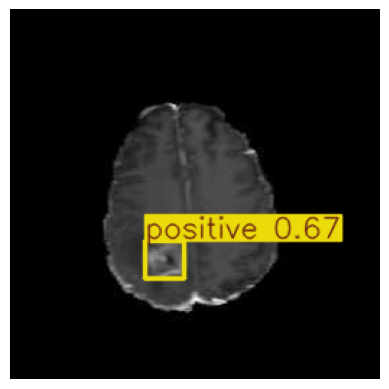

Image: val_1 (219).jpg
Boîte: [93.5701904296875, 160.15809631347656, 120.82679748535156, 186.41265869140625]
Class: 1
Confiance: 0.67
------------------------------

image 1/1 /root/.cache/kagglehub/datasets/ultralytics/brain-tumor/versions/2/brain-tumor/valid/images/val_1 (213).jpg: 480x480 1 negative, 1 positive, 13.4ms
Speed: 4.0ms preprocess, 13.4ms inference, 2.1ms postprocess per image at shape (1, 3, 480, 480)


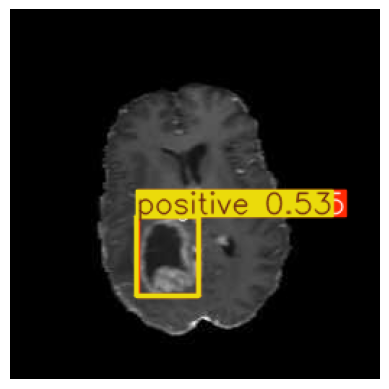

Image: val_1 (213).jpg
Boîte: [87.63003540039062, 143.75901794433594, 130.63726806640625, 198.318603515625]
Class: 1
Confiance: 0.53
------------------------------
Image: val_1 (213).jpg
Boîte: [88.21408081054688, 143.74769592285156, 130.265380859375, 198.44769287109375]
Class: 0
Confiance: 0.45
------------------------------

image 1/1 /root/.cache/kagglehub/datasets/ultralytics/brain-tumor/versions/2/brain-tumor/valid/images/val_1 (8).jpg: 480x480 1 negative, 19.9ms
Speed: 2.9ms preprocess, 19.9ms inference, 1.8ms postprocess per image at shape (1, 3, 480, 480)


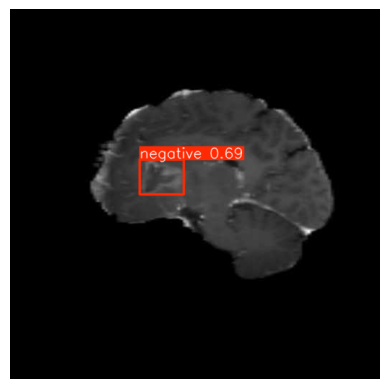

Image: val_1 (8).jpg
Boîte: [179.44097900390625, 208.14186096191406, 240.15625, 256.8844299316406]
Class: 0
Confiance: 0.69
------------------------------

image 1/1 /root/.cache/kagglehub/datasets/ultralytics/brain-tumor/versions/2/brain-tumor/valid/images/val_1 (190).jpg: 480x480 1 negative, 18.6ms
Speed: 2.7ms preprocess, 18.6ms inference, 3.8ms postprocess per image at shape (1, 3, 480, 480)


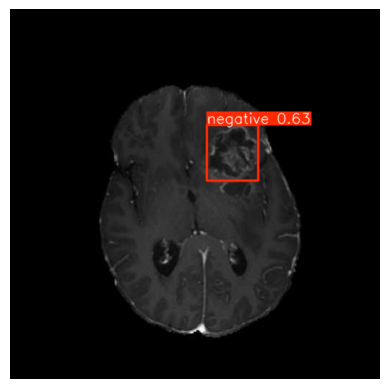

Image: val_1 (190).jpg
Boîte: [272.23358154296875, 160.41778564453125, 343.1969299316406, 237.63829040527344]
Class: 0
Confiance: 0.63
------------------------------

image 1/1 /root/.cache/kagglehub/datasets/ultralytics/brain-tumor/versions/2/brain-tumor/valid/images/val_1 (38).jpg: 480x480 2 negatives, 1 positive, 22.2ms
Speed: 6.3ms preprocess, 22.2ms inference, 2.9ms postprocess per image at shape (1, 3, 480, 480)


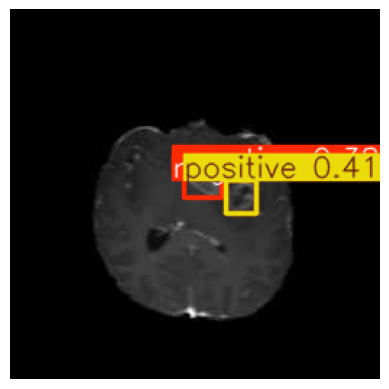

Image: val_1 (38).jpg
Boîte: [149.97093200683594, 118.55768585205078, 170.9224395751953, 141.63082885742188]
Class: 1
Confiance: 0.41
------------------------------
Image: val_1 (38).jpg
Boîte: [149.6940155029297, 118.66424560546875, 170.9420928955078, 141.1682891845703]
Class: 0
Confiance: 0.39
------------------------------
Image: val_1 (38).jpg
Boîte: [120.21186828613281, 112.74677276611328, 146.89031982421875, 130.03201293945312]
Class: 0
Confiance: 0.38
------------------------------

image 1/1 /root/.cache/kagglehub/datasets/ultralytics/brain-tumor/versions/2/brain-tumor/valid/images/val_1 (43).jpg: 480x480 1 negative, 22.7ms
Speed: 4.5ms preprocess, 22.7ms inference, 6.1ms postprocess per image at shape (1, 3, 480, 480)


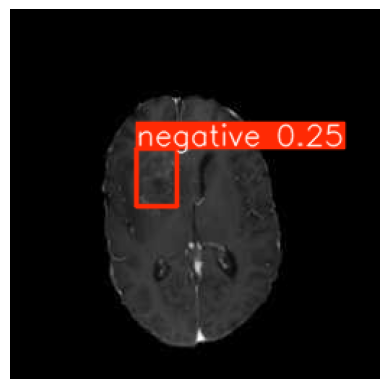

Image: val_1 (43).jpg
Boîte: [87.03797912597656, 96.17383575439453, 115.47368621826172, 136.33372497558594]
Class: 0
Confiance: 0.25
------------------------------

image 1/1 /root/.cache/kagglehub/datasets/ultralytics/brain-tumor/versions/2/brain-tumor/valid/images/val_1 (201).jpg: 480x480 1 negative, 1 positive, 21.2ms
Speed: 2.4ms preprocess, 21.2ms inference, 7.8ms postprocess per image at shape (1, 3, 480, 480)


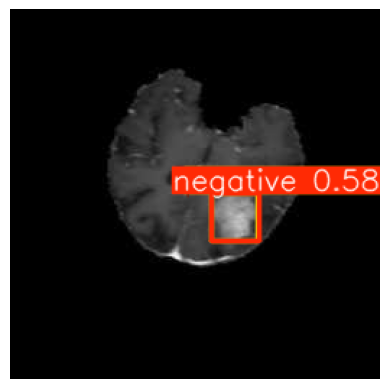

Image: val_1 (201).jpg
Boîte: [139.52780151367188, 127.76425170898438, 172.2436981201172, 160.20755004882812]
Class: 0
Confiance: 0.58
------------------------------
Image: val_1 (201).jpg
Boîte: [139.14453125, 127.27747344970703, 171.69949340820312, 160.61016845703125]
Class: 1
Confiance: 0.48
------------------------------

image 1/1 /root/.cache/kagglehub/datasets/ultralytics/brain-tumor/versions/2/brain-tumor/valid/images/val_1 (26).jpg: 480x480 1 positive, 11.8ms
Speed: 6.3ms preprocess, 11.8ms inference, 3.9ms postprocess per image at shape (1, 3, 480, 480)


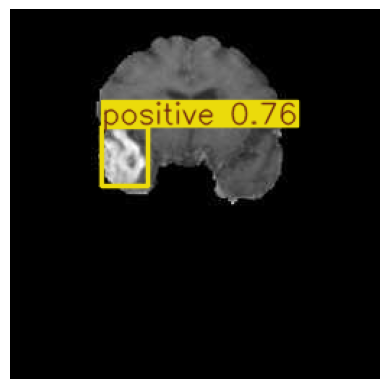

Image: val_1 (26).jpg
Boîte: [63.229583740234375, 81.5517807006836, 95.16194152832031, 122.62140655517578]
Class: 1
Confiance: 0.76
------------------------------

image 1/1 /root/.cache/kagglehub/datasets/ultralytics/brain-tumor/versions/2/brain-tumor/valid/images/val_1 (181).jpg: 480x480 1 negative, 19.1ms
Speed: 6.1ms preprocess, 19.1ms inference, 1.9ms postprocess per image at shape (1, 3, 480, 480)


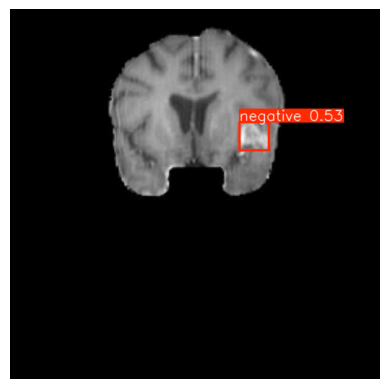

Image: val_1 (181).jpg
Boîte: [317.2366638183594, 156.88079833984375, 358.47808837890625, 195.71426391601562]
Class: 0
Confiance: 0.53
------------------------------

image 1/1 /root/.cache/kagglehub/datasets/ultralytics/brain-tumor/versions/2/brain-tumor/valid/images/val_1 (166).jpg: 480x480 1 negative, 1 positive, 19.4ms
Speed: 8.2ms preprocess, 19.4ms inference, 1.9ms postprocess per image at shape (1, 3, 480, 480)


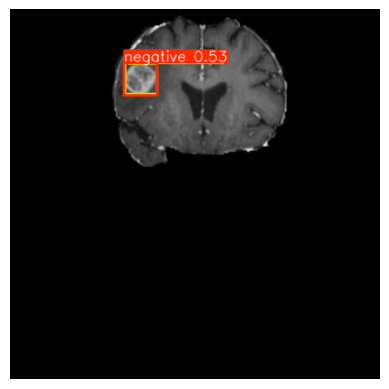

Image: val_1 (166).jpg
Boîte: [157.59255981445312, 74.3530502319336, 203.2320098876953, 119.24150848388672]
Class: 0
Confiance: 0.53
------------------------------
Image: val_1 (166).jpg
Boîte: [159.06973266601562, 75.7009048461914, 203.619873046875, 117.80891418457031]
Class: 1
Confiance: 0.39
------------------------------

image 1/1 /root/.cache/kagglehub/datasets/ultralytics/brain-tumor/versions/2/brain-tumor/valid/images/val_1 (179).jpg: 480x480 1 negative, 16.9ms
Speed: 6.6ms preprocess, 16.9ms inference, 1.9ms postprocess per image at shape (1, 3, 480, 480)


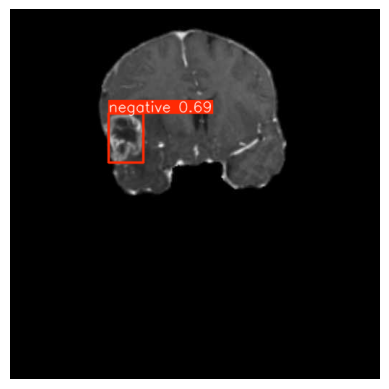

Image: val_1 (179).jpg
Boîte: [136.69677734375, 144.48287963867188, 184.72210693359375, 212.91928100585938]
Class: 0
Confiance: 0.69
------------------------------

image 1/1 /root/.cache/kagglehub/datasets/ultralytics/brain-tumor/versions/2/brain-tumor/valid/images/val_1 (64).jpg: 480x480 1 negative, 1 positive, 12.4ms
Speed: 2.9ms preprocess, 12.4ms inference, 1.9ms postprocess per image at shape (1, 3, 480, 480)


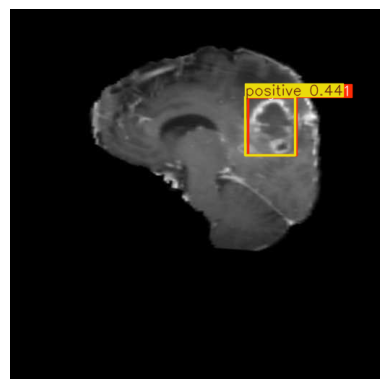

Image: val_1 (64).jpg
Boîte: [325.5144348144531, 121.99737548828125, 394.6224365234375, 202.5244598388672]
Class: 1
Confiance: 0.44
------------------------------
Image: val_1 (64).jpg
Boîte: [329.7261657714844, 122.33463287353516, 396.2923583984375, 202.05711364746094]
Class: 0
Confiance: 0.41
------------------------------


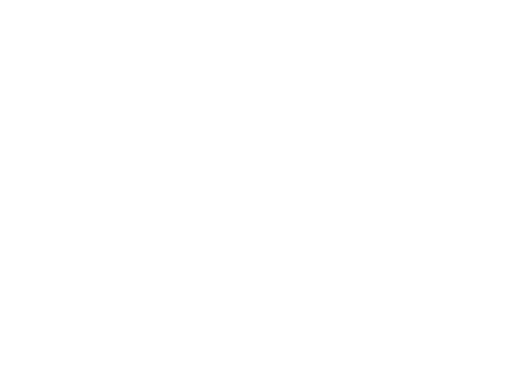

In [33]:
image_files = os.listdir(val_images_path)
images  =  image_files[:25]

for img_name  in images:
  img_path = os.path.join(val_images_path,img_name)
  results = tumor_model.predict(img_path)

  img = cv2.imread(img_path)
  img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

  for result in results:
    plot_img = result.plot()
    plt.imshow(plot_img)
    plt.show()
    plt.axis("off")

    boxes = result.boxes
    for box in boxes:
      xyxy = box.xyxy[0].tolist()
      cls = int(box.cls[0])
      conf = float(box.conf[0])
      print(f"Image: {img_name}")
      print(f"Boîte: {xyxy}")
      print(f"Class: {cls}")
      print(f"Confiance: {conf:.2f}")
      print("-" * 30)


In [42]:
from PIL import Image
yolo_train_dir = "/content/runs/detect/train"

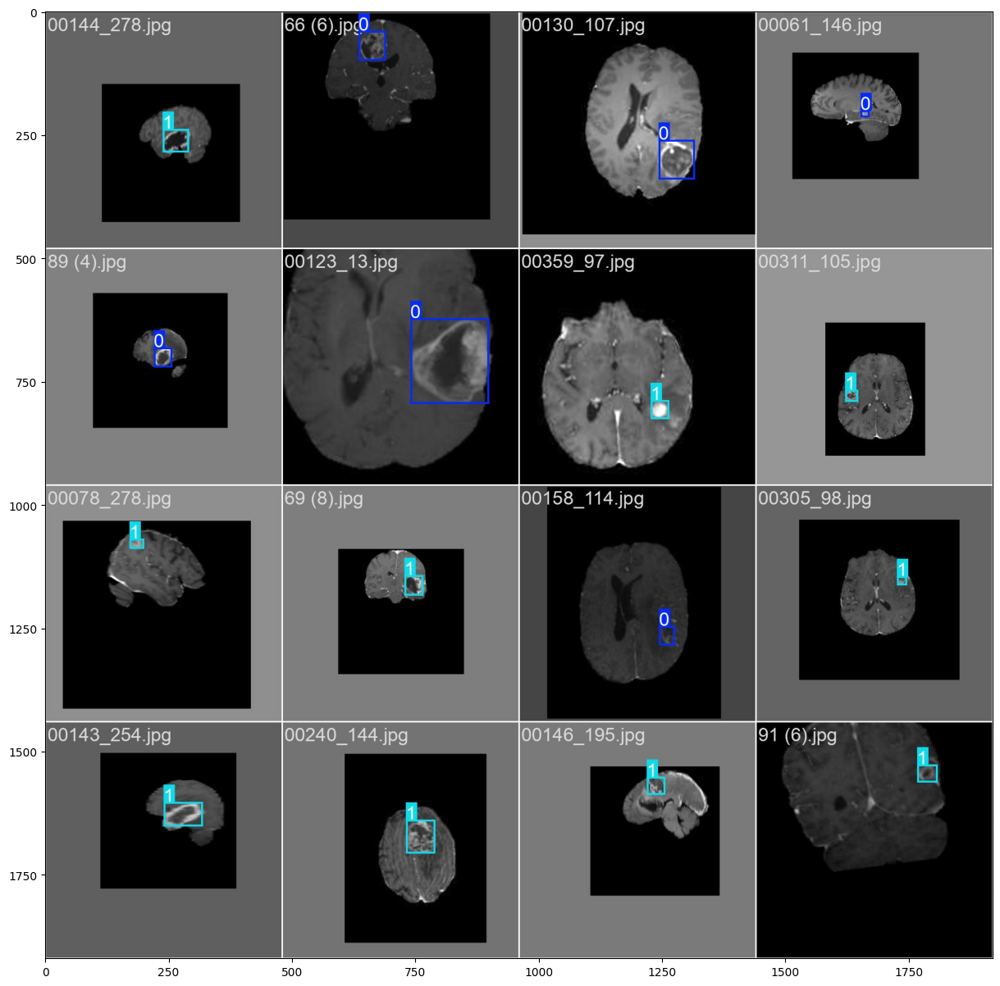

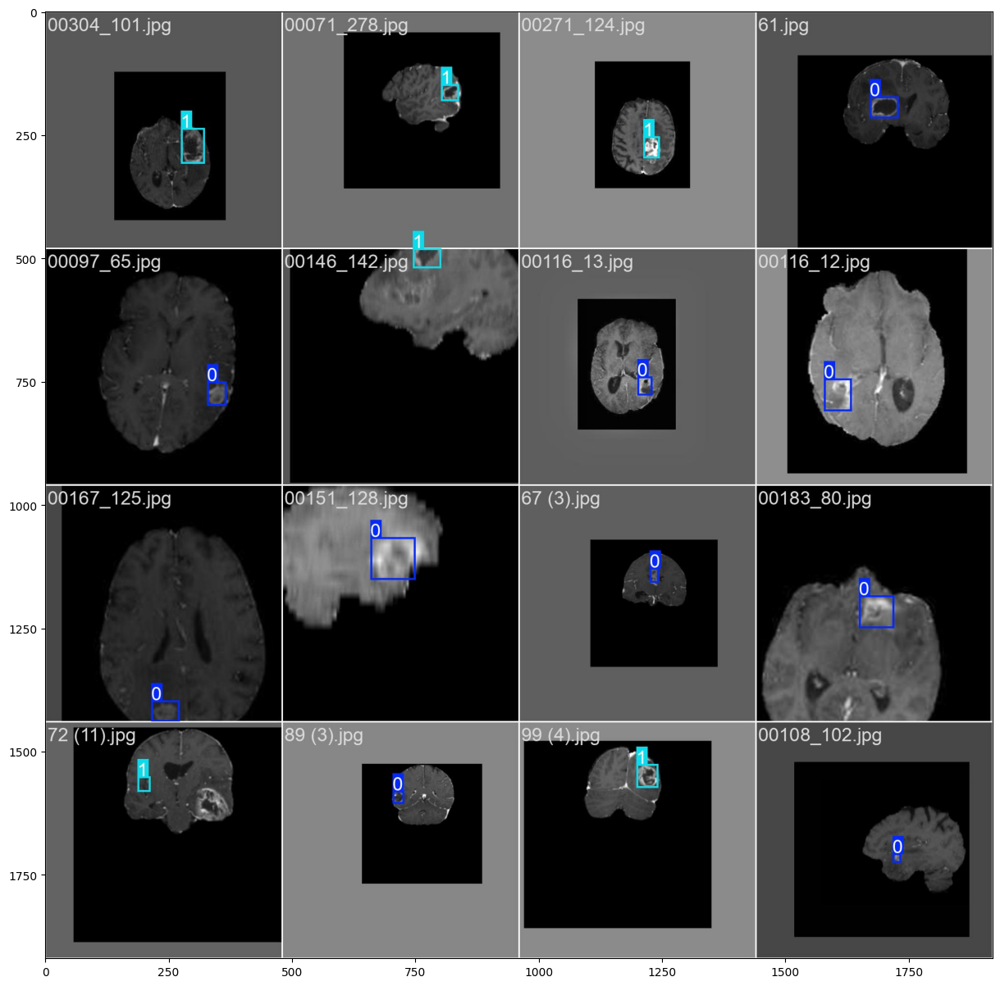

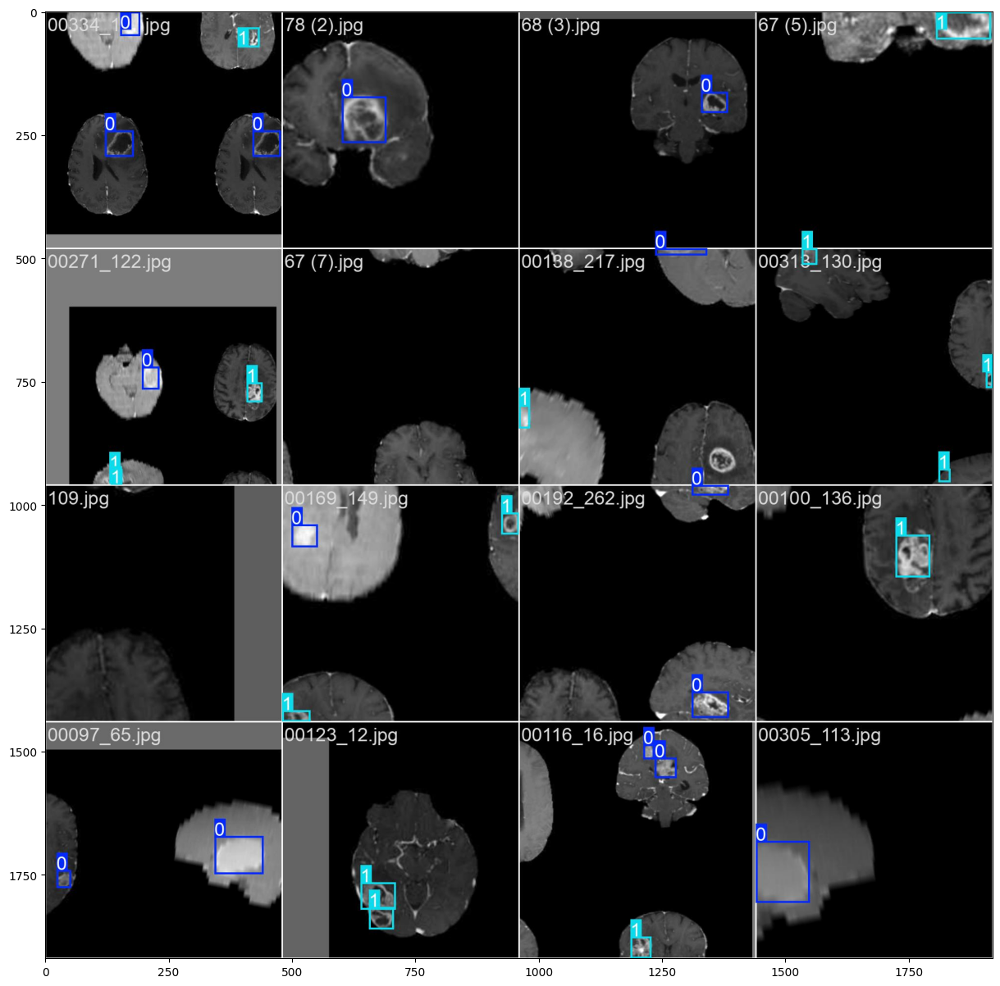

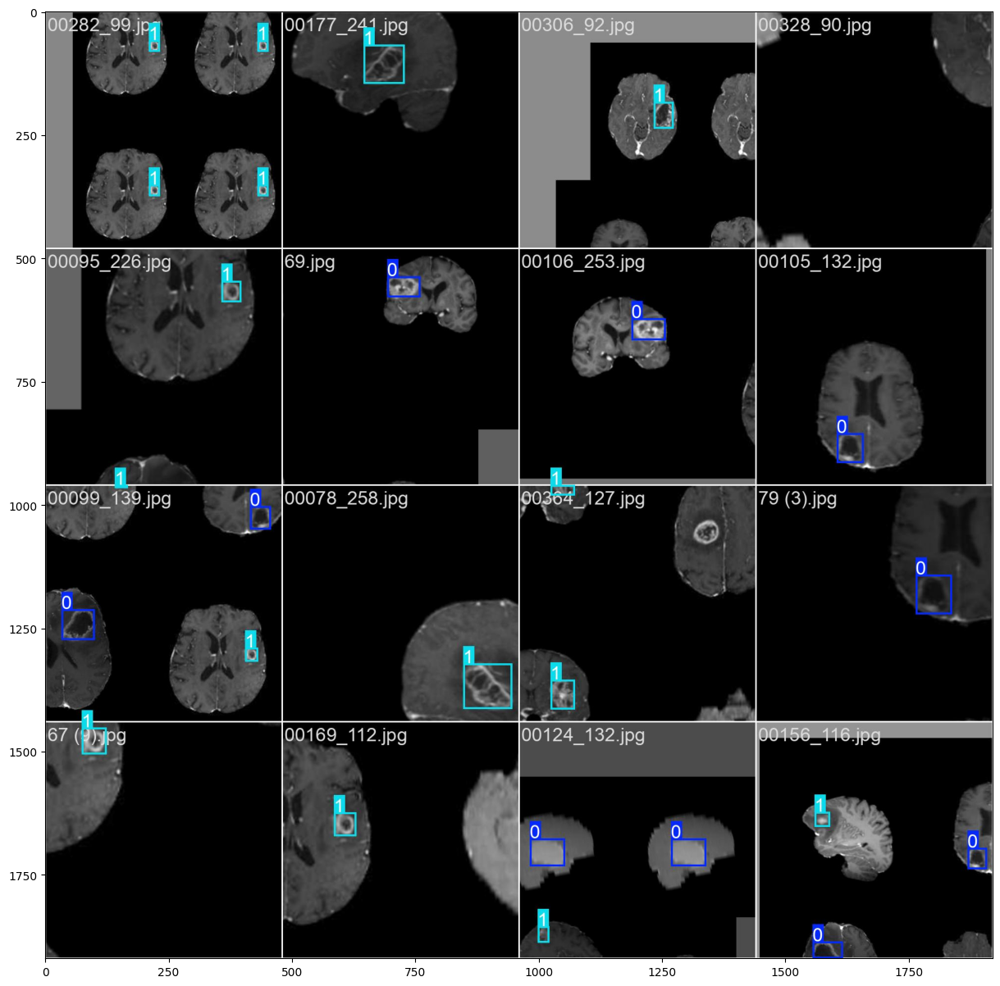

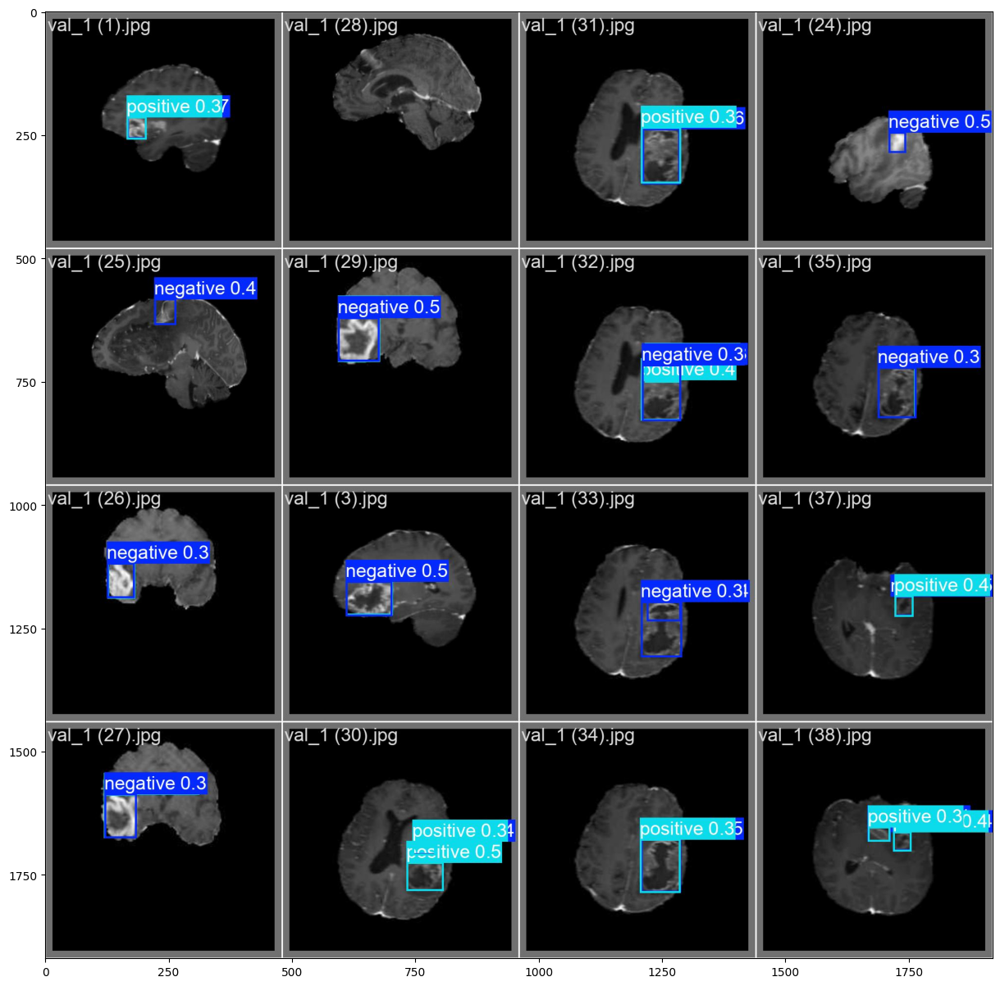

...

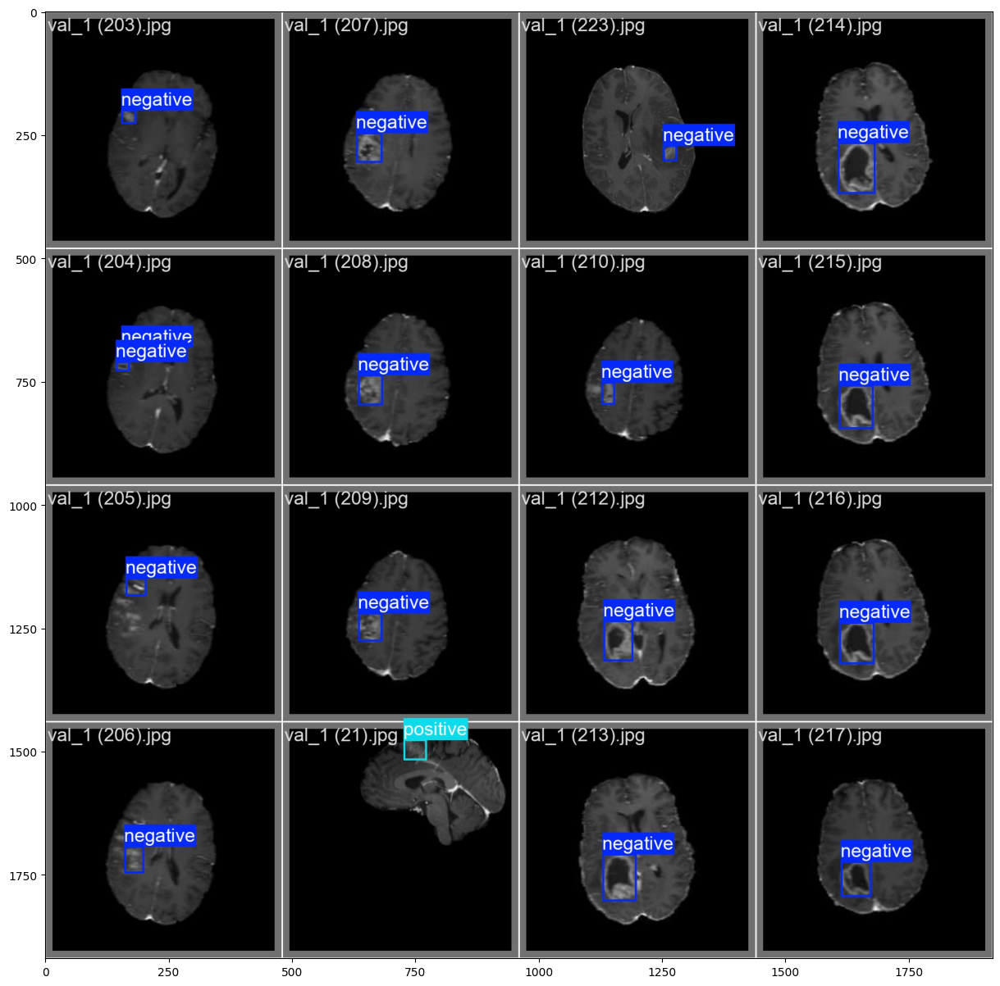

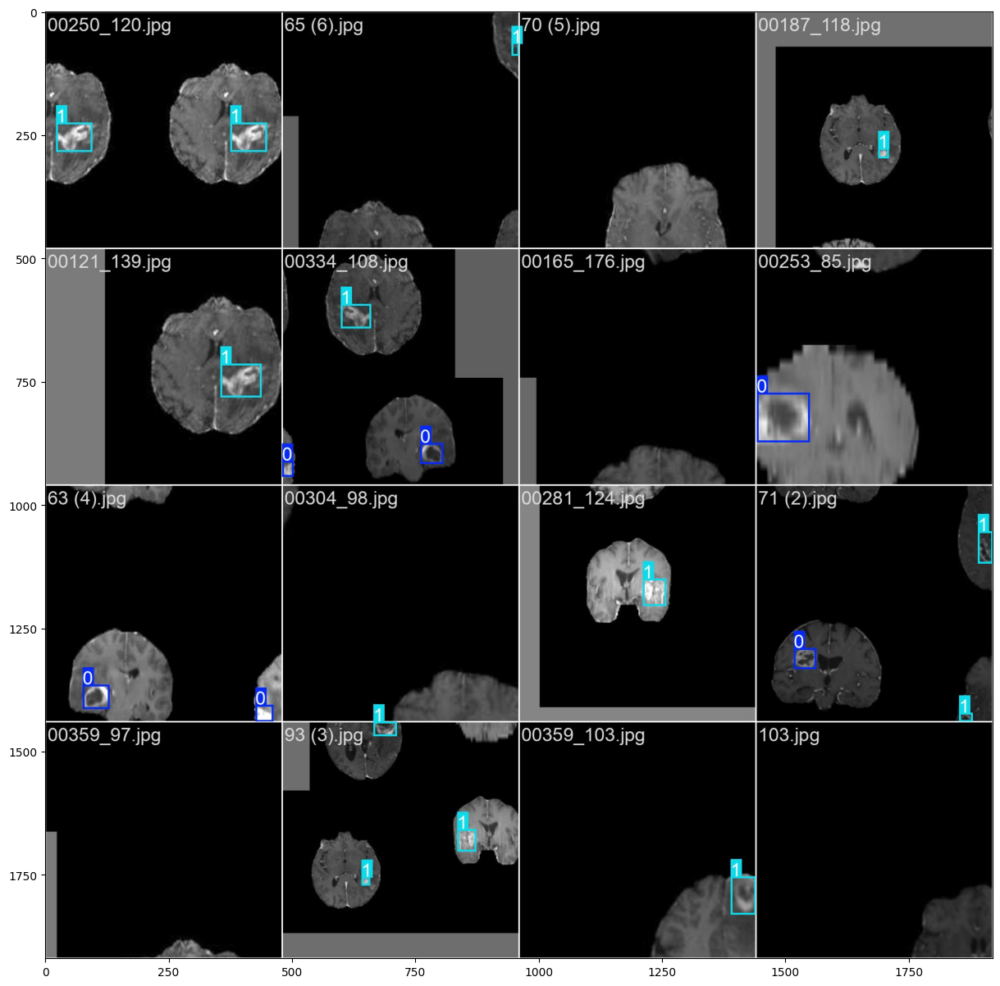

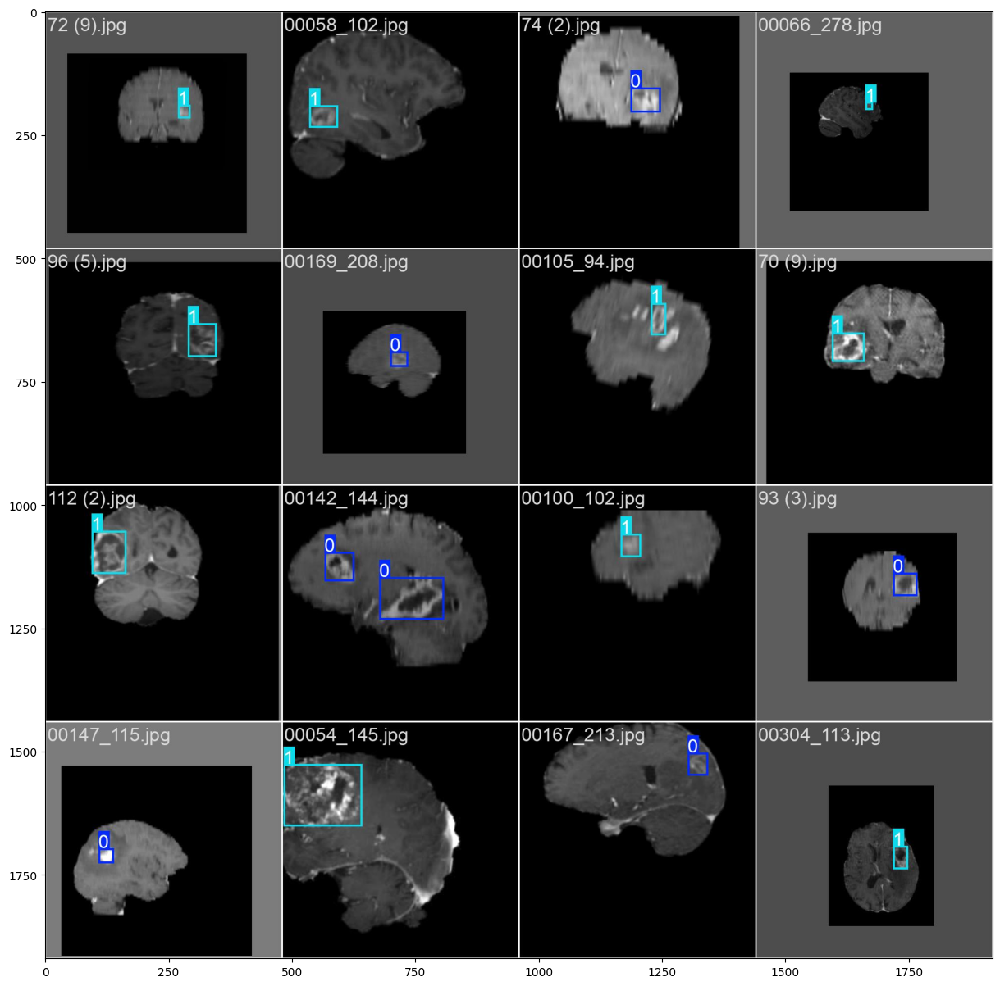

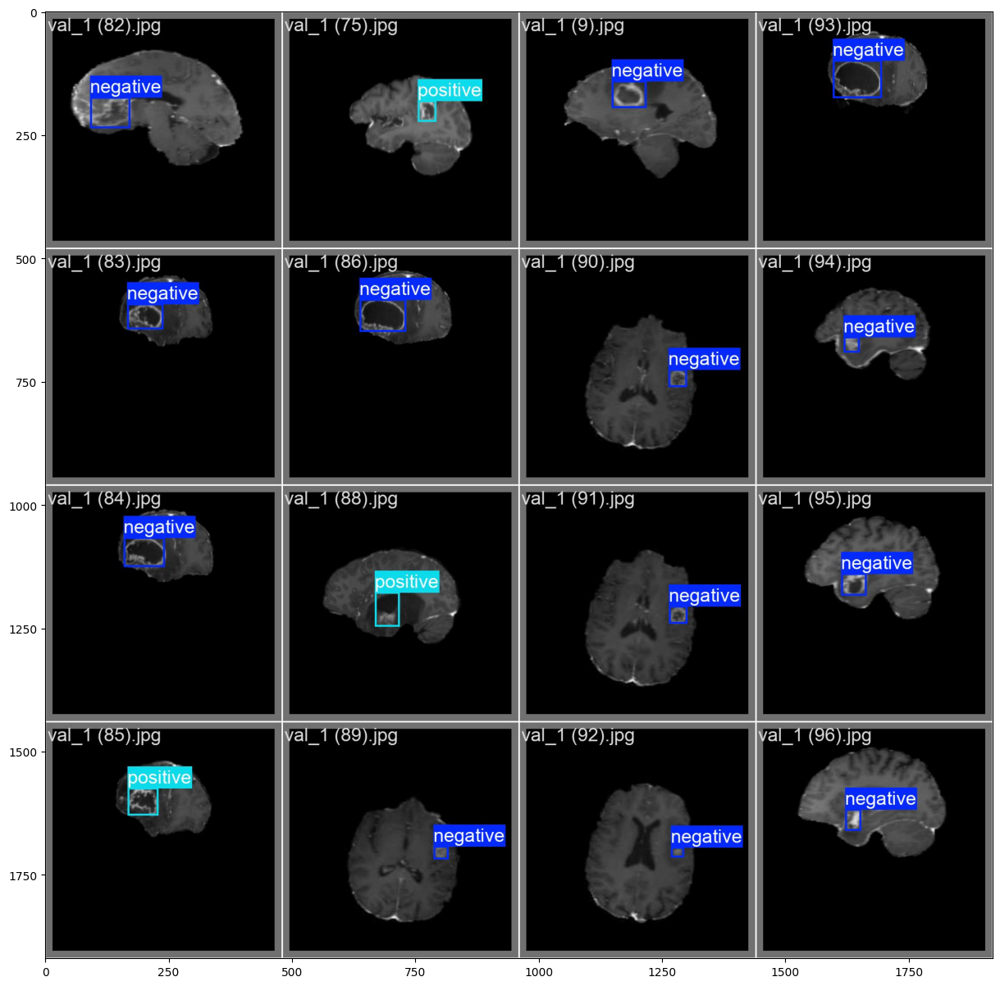

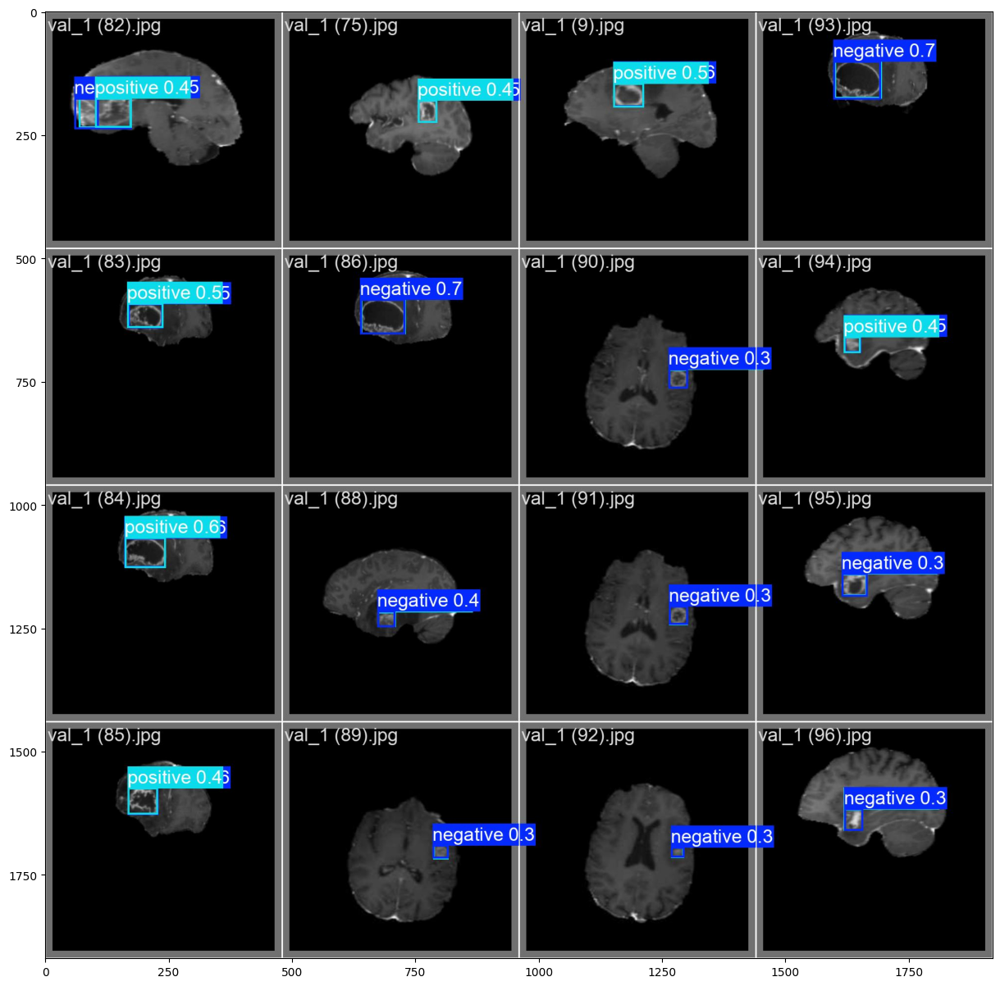

In [52]:
yolo_results_list = os.listdir(yolo_train_dir)
for result in yolo_results_list:
  if not result.endswith(".jpg"):
    continue
  plt.figure(figsize=(15,15))
  result_path = os.path.join(yolo_train_dir,result)
  img = Image.open(result_path)
  plt.imshow(img)
  plt.show()


image 1/1 /content/42979_2023_2208_Fig1_HTML.jpg: 480x384 1 negative, 1 positive, 11.5ms
Speed: 3.1ms preprocess, 11.5ms inference, 1.7ms postprocess per image at shape (1, 3, 480, 384)


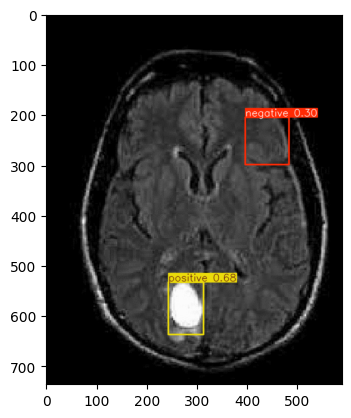

Image: val_1 (64).jpg
Boîte: [243.6707305908203, 533.1085205078125, 313.13372802734375, 637.4325561523438]
Class: 1
Confiance: 0.68
------------------------------
Image: val_1 (64).jpg
Boîte: [396.9428405761719, 205.99871826171875, 483.9444885253906, 299.358154296875]
Class: 0
Confiance: 0.30
------------------------------

image 1/1 /content/41598_2023_41576_Fig1_HTML.jpg: 480x480 1 negative, 12.7ms
Speed: 8.0ms preprocess, 12.7ms inference, 2.1ms postprocess per image at shape (1, 3, 480, 480)


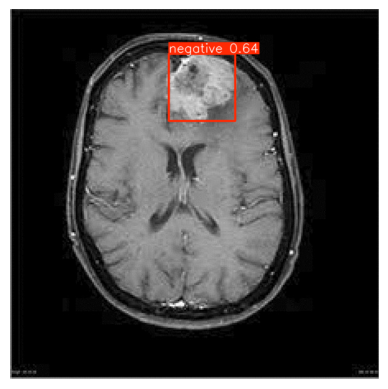

Image: val_1 (64).jpg
Boîte: [253.35171508789062, 71.69487762451172, 359.24365234375, 178.94696044921875]
Class: 0
Confiance: 0.64
------------------------------


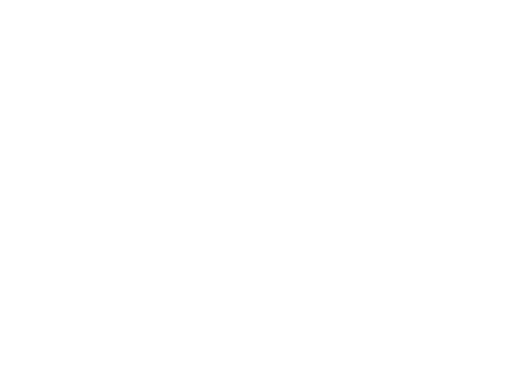

In [53]:
img_paths = ["/content/42979_2023_2208_Fig1_HTML.jpg","/content/41598_2023_41576_Fig1_HTML.jpg"]
for img_path in img_paths:
  img = cv2.imread(img_path)
  img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
  img = cv2.resize(img, (480, 480))
  results = tumor_model.predict(img_path)
  for result in results:
    plot_img = result.plot()
    plt.imshow(plot_img)
    plt.show()
    plt.axis("off")
    boxes = result.boxes
    for box in boxes:
        xyxy = box.xyxy[0].tolist()
        cls = int(box.cls[0])
        conf = float(box.conf[0])
        print(f"Image: {img_name}")
        print(f"Boîte: {xyxy}")
        print(f"Class: {cls}")
        print(f"Confiance: {conf:.2f}")
        print("-" * 30)